In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split, ConcatDataset
import tifffile as tiff
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from PIL import Image
from tqdm import tqdm
from torchvision import transforms

from skimage import io
import sys
# from umap import UMAP
import joblib
from datetime import datetime

# Load Data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [2]:
# Get the directory of the script
script_dir = os.getcwd()

# Get the parent directory of the script
parent_dir = os.path.dirname(script_dir)

# Add the parent directory to sys.path
sys.path.append(parent_dir)

from core.autoencoders import AE, train_ae
from core.dataset import TIFFDataset
from utils.feature_analysis import UMAP_train, dataloader_model_latents,kmeans_cluster,DBSCAN_cluster
from utils.plotting_utils import umap_2Dplot, cluster_2Dplot



In [ ]:
data_str = 'vin_pax_zyx_act_front'
pro_str = 'zyxin_front_loadercorrected_lossnorm'
main_ch = 2
ctrl_y_str = 'ctrl_y'
input_ps = 32
latent_dim_array = [4,5,6,7,8,9,10,12,14,16,18,20,22,24,26,28,30,32]
BN_flag = True
dropout_flag = True
epochs = int(10000)
lr = 1e-4
eps = 3
min_samples = 5
kmeans_num_clusters = 6
loss_norm_flag = 1

dir_list = [
'/mnt/d/lding/FA/analysis_results/FA_ML_Annabel_20250217/031125/ctrl_ch2_major/ctrl_ch2_patches_gridonly_pslocation00/tiff_patches32_65p_20250911_1120',
'/mnt/d/lding/FA/analysis_results/FA_ML_Annabel_20250217/031125/y_ch2_major/y_ch2_patches_gridonly_pslocation00/tiff_patches32_65p_20250909_1534',
]



In [ ]:

transform = transforms.Compose([transforms.ToTensor()])

datasets = [
    TIFFDataset(root_dir=dir_path, label=label, transform=transform)
    for label, dir_path in enumerate(dir_list)
]

combined_dataset = ConcatDataset(datasets)

# Split dataset into training and validation sets
train_size = int(0.8 * len(combined_dataset))
val_size = len(combined_dataset) - train_size
train_dataset, val_dataset = random_split(combined_dataset, [train_size, val_size])
whole_data_loader = DataLoader(combined_dataset, batch_size=128, shuffle=True)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)



/mnt/d/lding/CLS_GitHub/fa_patch_AE_clustering/core/dataset.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)  # shape: (1, H, W)


In [ ]:
total_sum_sq = 0.0
total_sum = 0.0
n_total = 0

for images, _ in whole_data_loader:
    images = images.to(torch.float32)
    total_sum += (images).sum().item()
    total_sum_sq += (images ** 2).sum().item()
    n_total += images.numel()

mean_square = total_sum_sq / n_total
mean = total_sum / n_total
print("Mean square of all pixels:", mean_square)

joblib.dump(mean_square,'../results/zyxin_front_mean_square.pkl')

Epoch 200/10000, Train Loss: 0.0010, Val Loss: 0.0010
Epoch 400/10000, Train Loss: 0.0009, Val Loss: 0.0008
Epoch 600/10000, Train Loss: 0.0008, Val Loss: 0.0008
Epoch 800/10000, Train Loss: 0.0008, Val Loss: 0.0007
Epoch 1000/10000, Train Loss: 0.0007, Val Loss: 0.0007
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0011, max: 0.1858, mean: 0.0104, std: 0.0108
Epoch 1200/10000, Train Loss: 0.0007, Val Loss: 0.0007
Epoch 1400/10000, Train Loss: 0.0007, Val Loss: 0.0007
Epoch 1600/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 1800/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 2000/10000, Train Loss: 0.0007, Val Loss: 0.0006
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0023, max: 0.2086, mean: 0.0119, std: 0.0112
Epoch 2200/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 2400/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 2600/10000, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0009, Val Loss: 0.0008
Epoch 400/10000, Train Loss: 0.0007, Val Loss: 0.0007
Epoch 600/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 800/10000, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 1000/10000, Train Loss: 0.0006, Val Loss: 0.0006
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0005, max: 0.2150, mean: 0.0083, std: 0.0116
Epoch 1200/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 1400/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 1600/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 1800/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 2000/10000, Train Loss: 0.0005, Val Loss: 0.0005
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0007, max: 0.2441, mean: 0.0095, std: 0.0120
Epoch 2200/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 2400/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 2600/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 2

/mnt/d/lding/CLS_GitHub/fa_patch_AE_clustering/core/autoencoders.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, n, figsize=(n * 1, 2))


Epoch 5200/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 5400/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 5600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 5800/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 6000/10000, Train Loss: 0.0005, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0006, max: 0.2346, mean: 0.0099, std: 0.0131
Epoch 6200/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 6400/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 6600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 6800/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 7000/10000, Train Loss: 0.0005, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0004, max: 0.2230, mean: 0.0094, std: 0.0124
Epoch 7200/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 7400/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 7600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epo

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0008, Val Loss: 0.0007
Epoch 400/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 600/10000, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 800/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 1000/10000, Train Loss: 0.0005, Val Loss: 0.0005
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0005, max: 0.1967, mean: 0.0093, std: 0.0126
Epoch 1200/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 1400/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 1600/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 1800/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 2000/10000, Train Loss: 0.0005, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0006, max: 0.2317, mean: 0.0097, std: 0.0129
Epoch 2200/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 2400/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 2600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0008, Val Loss: 0.0007
Epoch 400/10000, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 600/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 800/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 1000/10000, Train Loss: 0.0005, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0009, max: 0.2564, mean: 0.0095, std: 0.0123
Epoch 1200/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 1400/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0003, max: 0.2826, mean: 0.0094, std: 0.0134
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 2400/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 2600/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0007, Val Loss: 0.0007
Epoch 400/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 600/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 800/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 1000/10000, Train Loss: 0.0005, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0009, max: 0.2453, mean: 0.0092, std: 0.0128
Epoch 1200/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1400/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0008, max: 0.2795, mean: 0.0098, std: 0.0131
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 400/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 600/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 800/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 1000/10000, Train Loss: 0.0005, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0012, max: 0.2529, mean: 0.0106, std: 0.0130
Epoch 1200/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1400/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0003
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0007, max: 0.2643, mean: 0.0097, std: 0.0138
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 400/10000, Train Loss: 0.0006, Val Loss: 0.0005
Epoch 600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 800/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 1000/10000, Train Loss: 0.0004, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0008, max: 0.2460, mean: 0.0099, std: 0.0133
Epoch 1200/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1400/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0003
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0005, max: 0.2663, mean: 0.0097, std: 0.0136
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 400/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 800/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1000/10000, Train Loss: 0.0004, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0007, max: 0.2832, mean: 0.0091, std: 0.0131
Epoch 1200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0003
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0008, max: 0.2476, mean: 0.0094, std: 0.0137
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 400/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 800/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1000/10000, Train Loss: 0.0004, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0005, max: 0.2690, mean: 0.0099, std: 0.0128
Epoch 1200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0003
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0007, max: 0.2813, mean: 0.0095, std: 0.0134
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0007, Val Loss: 0.0006
Epoch 400/10000, Train Loss: 0.0005, Val Loss: 0.0005
Epoch 600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 800/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1000/10000, Train Loss: 0.0004, Val Loss: 0.0004
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0007, max: 0.2447, mean: 0.0094, std: 0.0134
Epoch 1200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0003
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0005, max: 0.2420, mean: 0.0090, std: 0.0137
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2600/10000, Train Loss: 0.0003, Val Loss: 0.0003
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epoch 200/10000, Train Loss: 0.0006, Val Loss: 0.0006
Epoch 400/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 600/10000, Train Loss: 0.0005, Val Loss: 0.0004
Epoch 800/10000, Train Loss: 0.0004, Val Loss: 0.0004
Epoch 1000/10000, Train Loss: 0.0004, Val Loss: 0.0003
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0007, max: 0.2611, mean: 0.0096, std: 0.0133
Epoch 1200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1400/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1600/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 1800/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2000/10000, Train Loss: 0.0004, Val Loss: 0.0003
Input stats — min: 0.0000, max: 0.2760, mean: 0.0091, std: 0.0184
Reconstruction stats — min: 0.0006, max: 0.2651, mean: 0.0094, std: 0.0139
Epoch 2200/10000, Train Loss: 0.0004, Val Loss: 0.0003
Epoch 2400/10000, Train Loss: 0.0003, Val Loss: 0.0003
Epoch 2600/10000, Train Loss: 0.0003, Val Loss: 0.0003
Epoch 2

/home/ldin/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


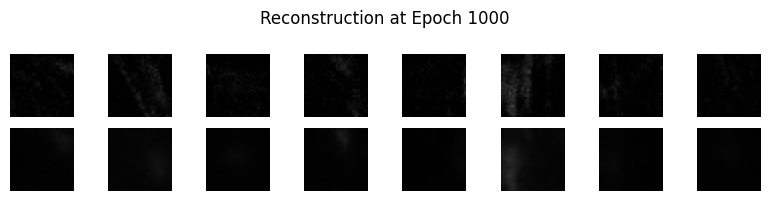

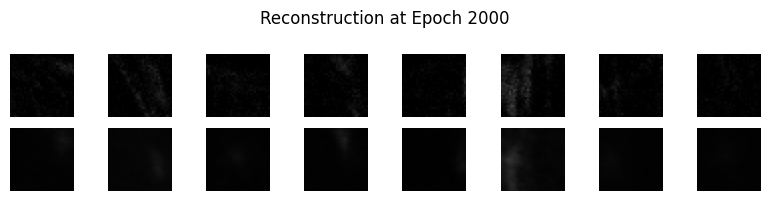

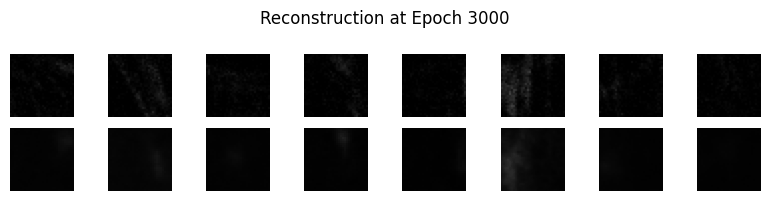

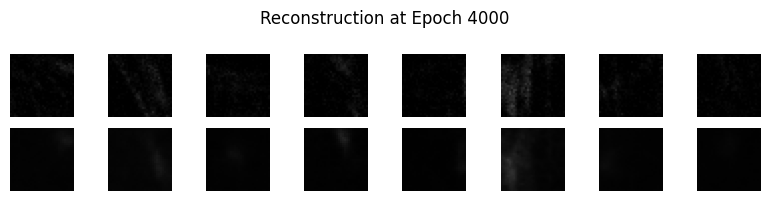

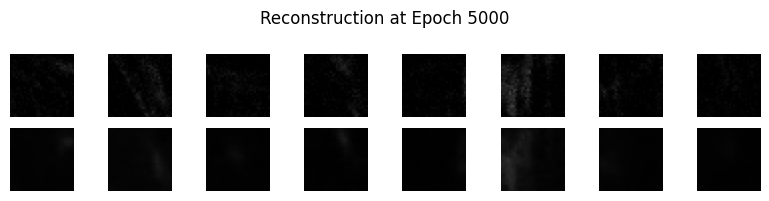

...

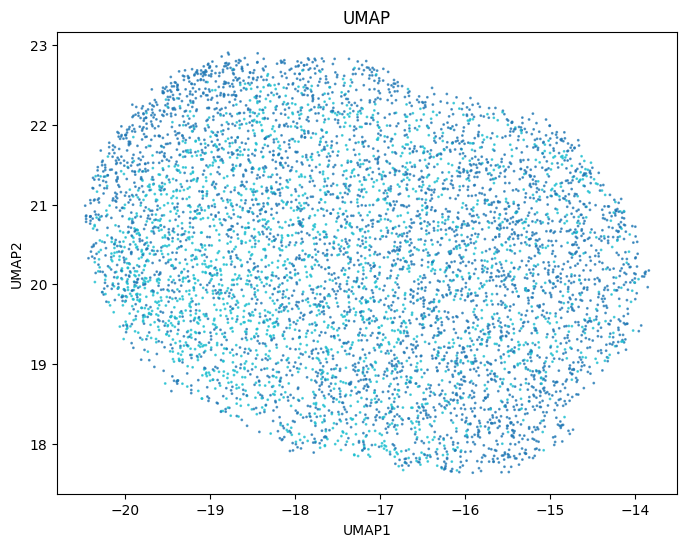

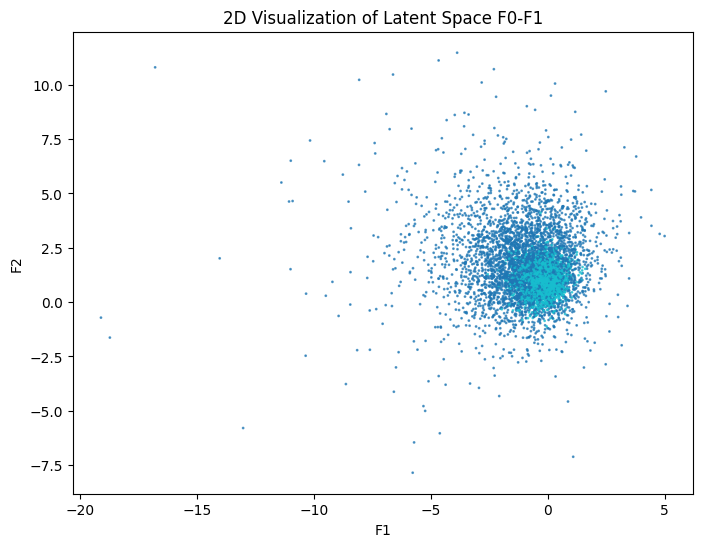

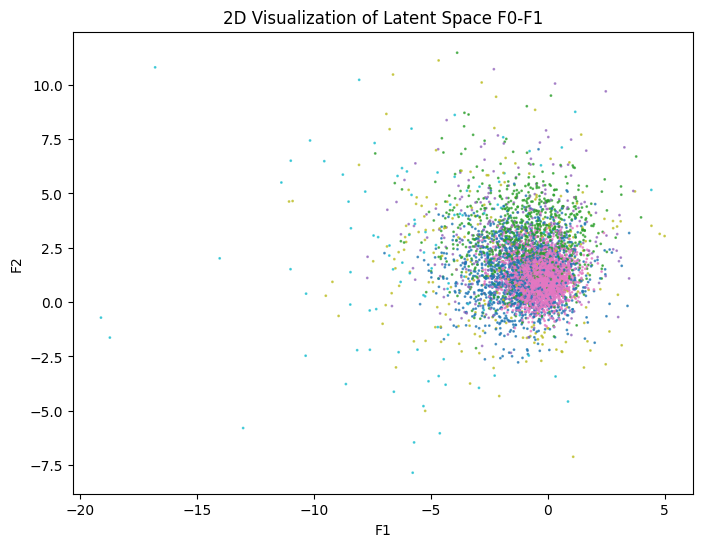

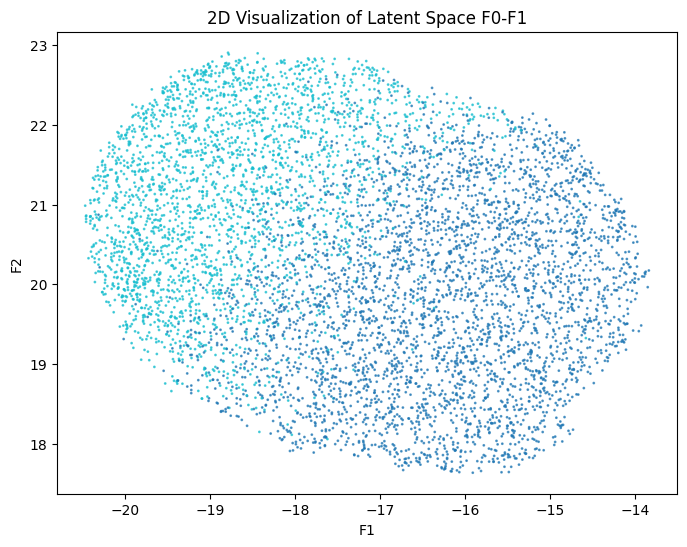

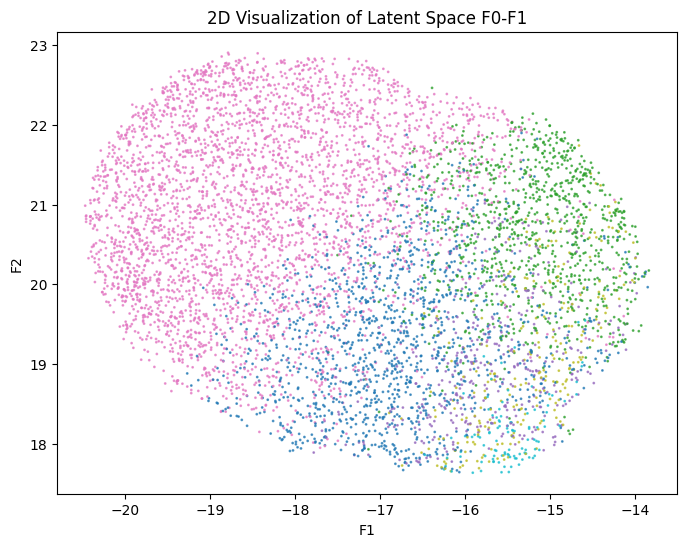

In [5]:
train_loss_across_latentdim = []
val_loss_across_latentdim = []

for  latent_dim in latent_dim_array:
        
    now = datetime.now()

    time_str = now.strftime("%Y%m%d_%H%M")

    result_dir = os.path.join('../results/', pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str)
    os.makedirs(result_dir, exist_ok=True)

    # Train AE
    ae = AE(latent_dim=latent_dim, input_ps=input_ps, BN_flag=BN_flag, dropout_flag=dropout_flag).to(device)

    ae, train_losses, val_losses = train_ae(ae, train_loader, val_loader, device, epochs=epochs, lr=lr, loss_norm_flag=loss_norm_flag, result_dir = result_dir)

    train_loss_across_latentdim.append(train_losses[-1])
    val_loss_across_latentdim.append(val_losses[-1])
    
    latents, images, group_id = dataloader_model_latents(ae, whole_data_loader, device)

    if isinstance(group_id, torch.Tensor):
        group_id = group_id.cpu().numpy()
    elif isinstance(group_id, list):
        group_id = torch.cat(group_id).cpu().numpy()

    latents_2d = UMAP_train(latents, result_dir)

    DBSCAN, DBSCAN_labels =  DBSCAN_cluster(latents, eps=eps, min_samples=min_samples, result_dir=result_dir)

    kmeans, kmeans_labels = kmeans_cluster(latents, num_clusters=kmeans_num_clusters, result_dir=result_dir)

    fig = umap_2Dplot(latents_2d, 0,1,group_id)
    fig.savefig(os.path.join(result_dir, 'umap_2d_grouplabels.png'))

    fig = cluster_2Dplot(latents, 0,1,DBSCAN_labels)
    fig.savefig(os.path.join(result_dir, 'DBSCAN_latent01_labels.png'))
    
    fig = cluster_2Dplot(latents, 0,1,kmeans_labels)
    fig.savefig(os.path.join(result_dir, 'kmeans_latent01_labels.png'))

    fig = cluster_2Dplot(latents_2d, 0,1,DBSCAN_labels)
    fig.savefig(os.path.join(result_dir, 'DBSCAN_umap2d_labels.png'))
    
    fig = cluster_2Dplot(latents_2d, 0,1,kmeans_labels)
    fig.savefig(os.path.join(result_dir, 'kmeans_umap2d_labels.png'))


In [6]:
joblib.dump(train_loss_across_latentdim, os.path.join('../results', 'train_loss_across_latentdim'+pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str+'.pkl'))
joblib.dump(val_loss_across_latentdim, os.path.join('../results', 'val_loss_across_latentdim'+pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str+'.pkl'))
    

['../results/val_loss_across_latentdimzyxin_front_ch2_ps32_latdim_24_20251002_1648.pkl']

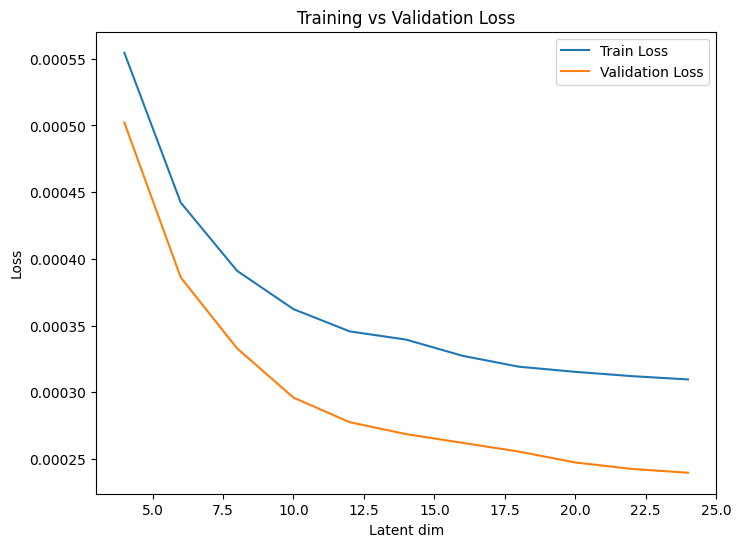

In [7]:
# Plot training and validation loss
fig = plt.figure(figsize=(8, 6))
plt.plot(latent_dim_array, train_loss_across_latentdim, label='Train Loss')
plt.plot(latent_dim_array, val_loss_across_latentdim, label='Validation Loss')
plt.xlabel('Latent dim')
plt.ylabel('Loss')
plt.legend()
plt.title('Training vs Validation Loss')
fig.savefig(os.path.join('../results', 'latent_dim_train_val_losses'+pro_str+'_ch' + str(main_ch) +'_'+ 'ps'+str(input_ps)+'_latdim_'+ str(latent_dim) +'_'+ time_str+'.png'))